# **Data Preparation**

In [27]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import os
import pathlib
from matplotlib import pyplot as plt
import seaborn as sns
import pickle
import pandas as pd
import numpy as np
import cv2
import skimage
from skimage.util import random_noise
import tensorflow as tf

from tqdm.notebook import tqdm
import random

In [28]:
def get_images_paths(root_dir_ssid):
    # Getting SSID dataset images
    root = pathlib.Path(root_dir_ssid)
    img_paths = list(root.rglob("*.PNG*"))
    img_paths_lst = [str(path) for path in img_paths]

    gt_lst = []
    noisy_lst= []
    
    for p in img_paths_lst:
        if "NOISY" in p and "checkpoints" not in p:
            noisy_lst.append(p)
        elif "GT" in p and "checkpoints" not in p:
            gt_lst.append(p)
            
    noisy_array = np.asarray(noisy_lst)
    gt_array = np.asarray(gt_lst)
    return noisy_array, gt_array

"""
    # Getting mi dataset images
    root = pathlib.Path(root_dir_mi)
    img_paths = list(root.rglob("*.bmp*"))
    img_paths_lst = [str(path) for path in img_paths]

    for p in img_paths_lst:
        img_type = p.split("/")[-1].split('_')[-1]
        if "Noisy" in img_type:
            noisy_lst.append(p)
        elif "Reference" in img_type:
            gt_lst.append(p)
            gt_lst.append(p)


    # Getting NIND dataset images
    root = pathlib.Path(root_dir_nind)
    img_paths = list(root.rglob("*.png*"))
    img_paths.extend(list(root.rglob("*.jpg*")))
    img_paths_lst = [str(path) for path in img_paths]

    for p in img_paths_lst:
        img_type = p.split("/")[-1].split("_")[-1]
        if "H" in img_type:
            noisy_lst.append(p)
        else:
            gt_lst.append(p)
"""
   

'\n    # Getting mi dataset images\n    root = pathlib.Path(root_dir_mi)\n    img_paths = list(root.rglob("*.bmp*"))\n    img_paths_lst = [str(path) for path in img_paths]\n\n    for p in img_paths_lst:\n        img_type = p.split("/")[-1].split(\'_\')[-1]\n        if "Noisy" in img_type:\n            noisy_lst.append(p)\n        elif "Reference" in img_type:\n            gt_lst.append(p)\n            gt_lst.append(p)\n\n\n    # Getting NIND dataset images\n    root = pathlib.Path(root_dir_nind)\n    img_paths = list(root.rglob("*.png*"))\n    img_paths.extend(list(root.rglob("*.jpg*")))\n    img_paths_lst = [str(path) for path in img_paths]\n\n    for p in img_paths_lst:\n        img_type = p.split("/")[-1].split("_")[-1]\n        if "H" in img_type:\n            noisy_lst.append(p)\n        else:\n            gt_lst.append(p)\n'

In [29]:
from sklearn.model_selection import train_test_split

noisy_array_paths, gt_array_paths = get_images_paths("SIDD_Small_sRGB_Only/Data")


print(len(noisy_array_paths))
print(len(gt_array_paths))

noisy_train_paths, noisy_test_paths, gt_train_paths, gt_test_paths = train_test_split(noisy_array_paths, gt_array_paths, test_size=0.20, random_state=42)

50
50


In [30]:
print(noisy_train_paths.shape)
print(noisy_test_paths.shape)
print(gt_train_paths.shape)
print(gt_test_paths.shape)

(40,)
(10,)
(40,)
(10,)


In [68]:
n_paths, gt_paths = get_images_paths("SIDD_custom_test")
print(n_paths,gt_paths)

['SIDD_custom_test\\1\\NOISY_1.png' 'SIDD_custom_test\\10\\NOISY_10.png'
 'SIDD_custom_test\\2\\NOISY_2.png' 'SIDD_custom_test\\3\\NOISY_3.png'
 'SIDD_custom_test\\4\\NOISY_4.png' 'SIDD_custom_test\\5\\NOISY_5.png'
 'SIDD_custom_test\\50\\NOISY_50.png' 'SIDD_custom_test\\6\\NOISY_6.png'
 'SIDD_custom_test\\7\\NOISY_7.png' 'SIDD_custom_test\\8\\NOISY_8.png'
 'SIDD_custom_test\\9\\NOISY_9.png' 'SIDD_custom_test\\90\\NOISY_90.png'] ['SIDD_custom_test\\1\\GT_1.png' 'SIDD_custom_test\\10\\GT_10.png'
 'SIDD_custom_test\\2\\GT_2.png' 'SIDD_custom_test\\3\\GT_3.png'
 'SIDD_custom_test\\4\\GT_4.png' 'SIDD_custom_test\\5\\GT_5.png'
 'SIDD_custom_test\\50\\GT_50.png' 'SIDD_custom_test\\6\\GT_6.png'
 'SIDD_custom_test\\7\\GT_7.png' 'SIDD_custom_test\\8\\GT_8.png'
 'SIDD_custom_test\\9\\GT_9.png' 'SIDD_custom_test\\90\\GT_90.png']


In [32]:
import cv2
import numpy as np
from tqdm import tqdm

def get_images_in_mem(images_paths, target_size=(256, 256)):
    """
    Loads images from specified paths, converts to RGB, resizes, and stores them in a numpy array.

    Args:
    images_paths (list of str): List of image file paths.
    target_size (tuple of int): Desired size (width, height) of the output images.

    Returns:
    numpy.ndarray: Array of processed images.
    """
    images_lst = []
    for img_path in tqdm(images_paths, desc="Loading images"):
        # Try to read and process each image
        try:
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, target_size)
                images_lst.append(img)
            else:
                print(f"Warning: Failed to read image at {img_path}. It may be corrupted or in an unsupported format.")
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return np.array(images_lst)

# Example usage:
# image_paths = ['path/to/image1.jpg', 'path/to/image2.jpg']
# images = get_images_in_mem(image_paths)


In [33]:
noisy_train_images = get_images_in_mem(noisy_train_paths)
noisy_test_images = get_images_in_mem(noisy_test_paths)

gt_train_images = get_images_in_mem(gt_train_paths)
gt_test_images = get_images_in_mem(gt_test_paths)

print(noisy_train_images.shape)
print(noisy_test_images.shape)

print(gt_train_images.shape)
print(gt_test_images.shape)

Loading images: 100%|██████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.30it/s]

(40, 256, 256, 3)
(10, 256, 256, 3)
(40, 256, 256, 3)
(10, 256, 256, 3)


In [69]:
n_t_images = get_images_in_mem(n_paths)
gt_t_images = get_images_in_mem(gt_paths)


Loading images: 100%|██████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00,  7.88it/s]


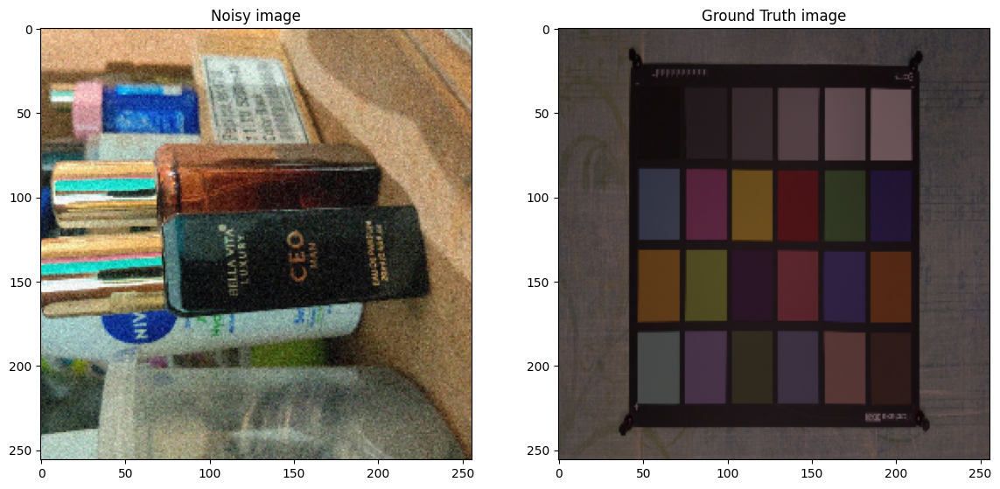

In [36]:
f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(n_t_images[5])
axarr[0].set_title("Noisy image")
axarr[1].imshow(gt_train_images[5])
axarr[1].title.set_text("Ground Truth image")

In [37]:
def _up_down_flip(image, label):
    image = tf.image.flip_up_down(image)
    label = tf.image.flip_up_down(label)
    return image, label

def _left_right_flip(image, label):
    image = tf.image.flip_left_right(image)
    label = tf.image.flip_left_right(label)
    return image, label

def _rotate(image, label):
    random_angle = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, random_angle)
    label = tf.image.rot90(label, random_angle)
    return image, label

def _hue(image, label):
    rand_value = random.uniform(-1,1)
    image = tf.image.adjust_hue(image, rand_value)
    label = tf.image.adjust_hue(label, rand_value)
    return image, label

def _brightness(image, label):
    rand_value = random.uniform(-0.08,0.25)
    image = tf.image.adjust_brightness(image, rand_value)
    label = tf.image.adjust_brightness(label, rand_value)
    return image, label

def _saturation(image, label):
    rand_value = random.uniform(1, 5)
    image = tf.image.adjust_saturation(image, rand_value)
    label = tf.image.adjust_saturation(label, rand_value)
    return image, label

def _contrast(image, label):
    rand_value = random.uniform(1, 3)
    image = tf.image.adjust_contrast(image, rand_value)
    label = tf.image.adjust_contrast(label, rand_value)
    return image, label

# What does batch, repeat, and shuffle do with TensorFlow Dataset?
# https://stackoverflow.com/q/53514495/7697658
def tf_data_generator(X, y, batch_size=32, augmentations=None):
    dataset = tf.data.Dataset.from_tensor_slices((X, y)) # This is the main step for data generation
    dataset = dataset.shuffle(1000, reshuffle_each_iteration=True)

    if augmentations:
        for f in augmentations:
            if np.random.uniform(0,1)<0.5:
                dataset = dataset.map(f, num_parallel_calls=2)

    dataset = dataset.repeat()
    dataset = dataset.batch(batch_size=batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset

BATCH_SIZE=4
augmentation_lst = [_up_down_flip, _left_right_flip, _rotate]
image_generator_train = tf_data_generator(X=noisy_train_images, y=gt_train_images, batch_size=BATCH_SIZE, augmentations=augmentation_lst)
image_generator_test = tf_data_generator(X=noisy_test_images, y=gt_test_images, batch_size=BATCH_SIZE)

In [38]:
image_generator_train

<_PrefetchDataset element_spec=(TensorSpec(shape=(4, 256, 256, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(4, 256, 256, 3), dtype=tf.uint8, name=None))>

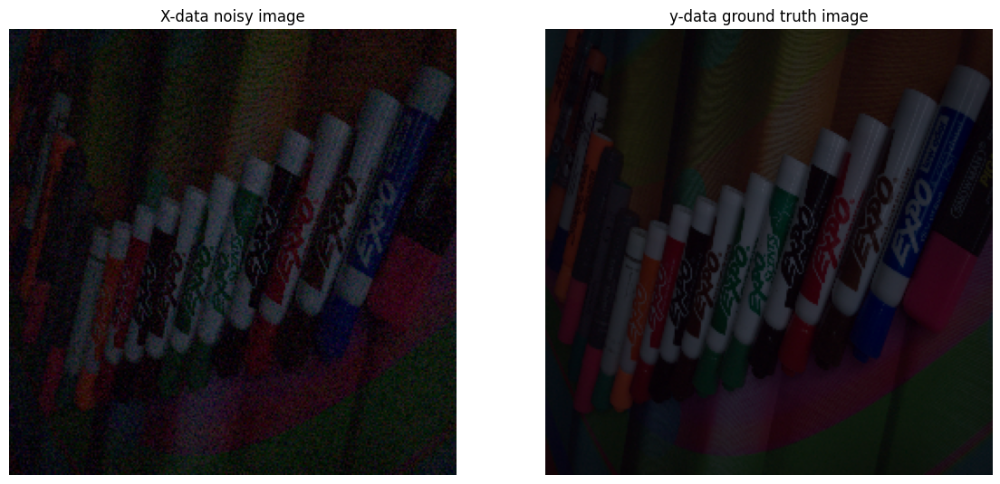

In [39]:
# SANITY CHECK of the Dataset generator
for noisy, gt in image_generator_train.take(1):  # only take first element of dataset
    numpy_images = noisy.numpy()
    numpy_labels = gt.numpy()

f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(numpy_images[1])
axarr[0].set_title("X-data noisy image")
axarr[0].set_axis_off()

axarr[1].imshow(numpy_labels[1])
axarr[1].set_title("y-data ground truth image")
axarr[1].set_axis_off()

# **MWCNN**

In [46]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose,\
                                    GlobalAveragePooling2D, AveragePooling2D, MaxPool2D, UpSampling2D,\
                                    BatchNormalization, Activation, ReLU, Flatten, Dense, Input,\
                                    Add, Multiply, Concatenate, Softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.activations import softmax

tf.keras.backend.set_image_data_format('channels_last')
import tensorflow.keras.backend as K


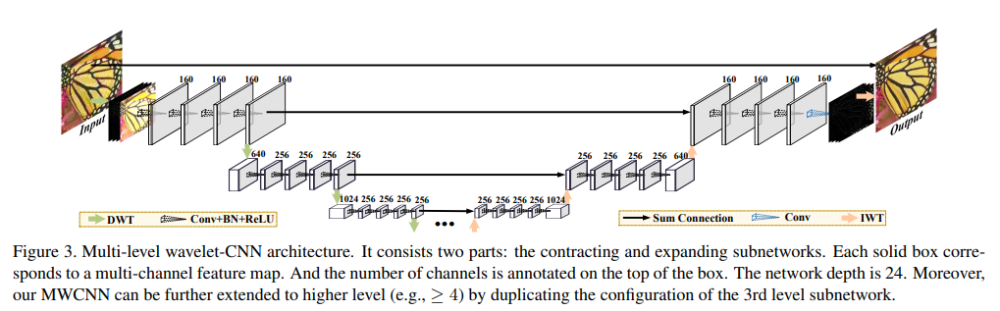

In [47]:
class Conv_block(tf.keras.layers.Layer):
    def  __init__(self, num_filters=200, kernel_size=3, **kwargs):
        super().__init__(**kwargs)
        self.num_filters=num_filters
        self.kernel_size=kernel_size
        self.conv_1 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_2 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_3 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_4 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')

        self.bn_1 = BatchNormalization()
        self.bn_2 = BatchNormalization()
        self.bn_3 = BatchNormalization()
        self.bn_4 = BatchNormalization()
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'num_filters': self.num_filters,
            'kernel_size':self.kernel_size
        })
        return config

    def call(self, X):
        X = self.conv_1(X)
        # X = self.bn_1(X)
        X = ReLU()(X)
        X = self.conv_2(X)
        # X = self.bn_2(X)
        X = ReLU()(X)
        X = self.conv_3(X)
        # X = self.bn_3(X)
        X = ReLU()(X)
        # X = self.conv_4(X)
        # # X = self.bn_4(X)
        # X = ReLU()(X)

        return X

In [48]:
class DWT_downsampling(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        
    def call(self, x):
        """
        The following calculations for DWT are inspired from,
        https://github.com/AureliePeng/Keras-WaveletTransform/blob/master/models/DWT.py
        """
        x1 = x[:, 0::2, 0::2, :] #x(2i−1, 2j−1)
        x2 = x[:, 1::2, 0::2, :] #x(2i, 2j-1)
        x3 = x[:, 0::2, 1::2, :] #x(2i−1, 2j)
        x4 = x[:, 1::2, 1::2, :] #x(2i, 2j)   

        x_LL = x1 + x2 + x3 + x4
        x_LH = -x1 - x3 + x2 + x4
        x_HL = -x1 + x3 - x2 + x4
        x_HH = x1 - x3 - x2 + x4

        return Concatenate(axis=-1)([x_LL, x_LH, x_HL, x_HH])

In [49]:
class IWT_upsampling(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        
    def call(self, x):
        """
        The following calculations for IWT are inspired from,
        https://github.com/AureliePeng/Keras-WaveletTransform/blob/master/models/DWT.py
        """
        x_LL = x[:, :, :, 0:x.shape[3]//4]
        x_LH = x[:, :, :, x.shape[3]//4:x.shape[3]//4*2]
        x_HL = x[:, :, :, x.shape[3]//4*2:x.shape[3]//4*3]
        x_HH = x[:, :, :, x.shape[3]//4*3:]

        x1 = (x_LL - x_LH - x_HL + x_HH)/4
        x2 = (x_LL - x_LH + x_HL - x_HH)/4
        x3 = (x_LL + x_LH - x_HL - x_HH)/4
        x4 = (x_LL + x_LH + x_HL + x_HH)/4 

        y1 = K.stack([x1,x3], axis=2)
        y2 = K.stack([x2,x4], axis=2)
        shape = K.shape(x)
        return K.reshape(K.concatenate([y1,y2], axis=-1), K.stack([shape[0], shape[1]*2, shape[2]*2, shape[3]//4]))

In [50]:
# def create_model():
#     tf.keras.backend.clear_session()

#     input = Input(shape=(256,256,3))

#     cb_1 = Conv_block(num_filters=64)(input)
#     # print("cb 1=",cb_1.shape)
#     dwt_1 = DWT_downsampling()(cb_1)
#     # print("dwt 1=",dwt_1.shape)

#     cb_2 = Conv_block(num_filters=128)(dwt_1)
#     # print("cb 2=",cb_2.shape)
#     dwt_2 = DWT_downsampling()(cb_2)
#     # print("dwt 2=",dwt_2.shape)

#     cb_3 = Conv_block(num_filters=256)(dwt_2)
#     cb_4 = Conv_block(num_filters=256)(cb_3)
#     cb_4 = Conv2D(filters=512, kernel_size=3, strides=1, padding='same')(cb_4)

#     iwt_1 = IWT_upsampling()(cb_4)
#     cb_5 = Conv_block(num_filters=128)(Add()([iwt_1, cb_2]))
#     cb_5 = Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(cb_5)

#     iwt_2 = IWT_upsampling()(cb_5)
#     cb_6 = Conv_block(num_filters=64)(Add()([iwt_2, cb_1]))
#     cb_6 = Conv2D(filters=3, kernel_size=(1, 1), padding="same")(cb_6)

#     out = cb_6

#     return Model(inputs=[input], outputs=[out])

In [51]:
def create_model():
    tf.keras.backend.clear_session()

    input = Input(shape=(256,256,3))

    cb_1 = Conv_block(num_filters=64)(input)
    dwt_1 = DWT_downsampling()(cb_1)

    cb_2 = Conv_block(num_filters=128)(dwt_1)
    dwt_2 = DWT_downsampling()(cb_2)

    cb_3 = Conv_block(num_filters=256)(dwt_2)
    dwt_3 = DWT_downsampling()(cb_3)

    cb_4 = Conv_block(num_filters=512)(dwt_3)
    dwt_4 = DWT_downsampling()(cb_4)

    cb_5 = Conv_block(num_filters=512)(dwt_4)
    cb_5 = BatchNormalization()(cb_5)
    cb_5 = Conv_block(num_filters=512)(cb_5)
    cb_5 = Conv2D(filters=2048, kernel_size=3, strides=1, padding='same')(cb_5)

    up = IWT_upsampling()(cb_5)
    up = Conv_block(num_filters=512)(Add()([up, cb_4]))
    up = Conv2D(filters=1024, kernel_size=3, strides=1, padding='same')(up)

    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=256)(Add()([up, cb_3]))
    up = Conv2D(filters=512, kernel_size=3, strides=1, padding='same')(up)
    
    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=128)(Add()([up, cb_2]))
    up = Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(up)
    
    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=64)(Add()([up, cb_1]))
    up = Conv2D(filters=128, kernel_size=3, strides=1, padding='same')(up)

    out = Conv2D(filters=3, kernel_size=(1, 1), padding="same")(up)

    return Model(inputs=[input], outputs=[out])

model = create_model()
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block (Conv_block)       │ (None, 256, 256, 64)      │          75,648 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dwt_downsampling              │ (None, 128, 128, 256)     │               0 │ conv_block[0][0]           │
│ (DWT_downsampling)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block_1 (Conv_block)     │ (None, 128, 128, 128)     │         590,208 │ dwt_downsampling[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dwt_downsampling_1            │ (None, 64, 64, 512)       │               0 │ conv_block_1[0][0]         │
│ (DWT_downsampling)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block_2 (Conv_block)     │ (None, 64, 64, 256)       │       2,360,064 │ dwt_downsampling_1[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dwt_downsampling_2            │ (None, 32, 32, 1024)      │               0 │ conv_block_2[0][0]         │
│ (DWT_downsampling)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block_3 (Conv_block)     │ (None, 32, 32, 512)       │       9,438,720 │ dwt_downsampling_2[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dwt_downsampling_3            │ (None, 16, 16, 2048)      │               0 │ conv_block_3[0][0]         │
│ (DWT_downsampling)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block_4 (Conv_block)     │ (None, 16, 16, 512)       │      14,157,312 │ dwt_downsampling_3[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_20        │ (None, 16, 16, 512)       │           2,048 │ conv_block_4[0][0]         │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv_block_5 (Conv_block)     │ (None, 16, 16, 512)       │       7,079,424 │ batch_normalization_20[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_24 (Conv2D)            │ (None, 16, 16, 2048)      │       9,439,232 │ conv_block_5[0][0]         │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ iwt_upsampling                │ (None, 32, 32, 512)       │               0 │ conv2d_24[0][0]            │
│ (IWT_upsampling)              │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 58,815,043 (224.36 MB)

 Trainable params: 58,814,019 (224.36 MB)

 Non-trainable params: 1,024 (4.00 KB)

# **Training**

In [52]:
steps_per_epoch_train = len(noisy_train_images)
steps_per_epoch_validation = len(noisy_test_images)

In [53]:
callbacks_lst = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.0000009, min_delta=0.0001, factor=0.70, patience=3, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, min_delta=0.0001, patience=10)
]

In [55]:
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0009))
model.fit(image_generator_train, 
          validation_data=image_generator_test,
                        steps_per_epoch=steps_per_epoch_train,
                        validation_steps=steps_per_epoch_validation,
                        epochs=20,
                        verbose=1,
                        callbacks=callbacks_lst)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 437s 11s/step - loss: 25068434.0000 - val_loss: 435.2379 - learning_rate: 9.0000e-04
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 446s 11s/step - loss: 589.4448 - val_loss: 403.4508 - learning_rate: 9.0000e-04
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 436s 11s/step - loss: 498.0431 - val_loss: 362.7052 - learning_rate: 9.0000e-04
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 428s 11s/step - loss: 463.1486 - val_loss: 322.6113 - learning_rate: 9.0000e-04
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 428s 11s/step - loss: 375.2346 - val_loss: 219.9916 - learning_rate: 9.0000e-04
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 422s 11s/step - loss: 264.6876 - val_loss: 173.8310 - learning_rate: 9.0000e-04
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 455s 11s/step - loss: 200.0806 - val_loss: 152.4552 - learning_rate: 9.0000e-04
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 449s 11s/step - loss: 174.8629 - val_loss: 157.3098 - learning_rate: 9.0000e-04
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 473s 12s/step

In [57]:
model.save("best_MWCNN_blindnoise_256x256.keras")

In [60]:
model = tf.keras.models.load_model('best_MWCNN_blindnoise_256x256.keras', custom_objects={'DWT_downsampling':DWT_downsampling,
                                                                                                        'IWT_upsampling':IWT_upsampling,
                                                                                                        'Conv_block':Conv_block})

# **Inference**

gt_images are in range of 0-255 (int);<br>
noisy_images are in range of 0-255 (int);<br>
predicted_images are in range 0-255 (float);

In [61]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)
    
    return predicted_image[0]

def inference_batch_images(model, noisy_images):
    predicted_image = model.predict(noisy_images)
    return predicted_image

In [66]:
def visualize_predictions(model, X_test, y_test, n):
    random_numbers = random.choices(range(X_test.shape[0]), k=n)    # Get n random indices
    for i in range(n):
        noisy_image = X_test[i]
        gt_image = y_test[i]
        predicted_image = inference_single_image(model, X_test[i])
        predicted_image/=255

        f, axarr = plt.subplots(1,3, figsize=(21,21))
        axarr[0].imshow(noisy_image)
        axarr[0].set_title("Noisy image")
        axarr[0].set_axis_off()
        axarr[1].imshow(gt_image)
        axarr[1].set_title("Ground truth image")
        axarr[1].set_axis_off()
        axarr[2].imshow(predicted_image)
        axarr[2].set_title("Predicted image")
        axarr[2].set_axis_off()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


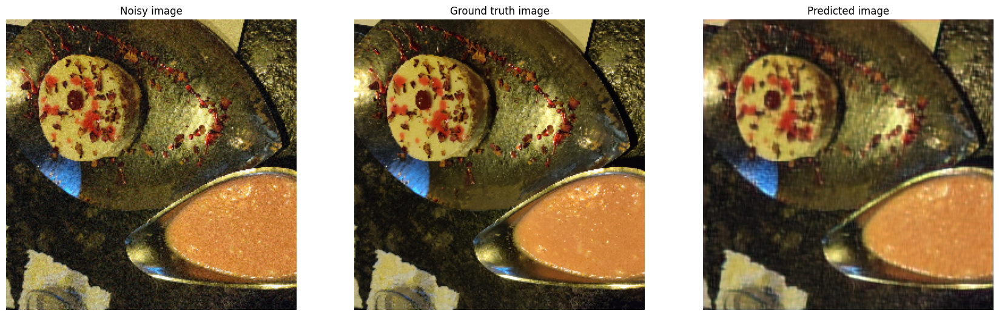

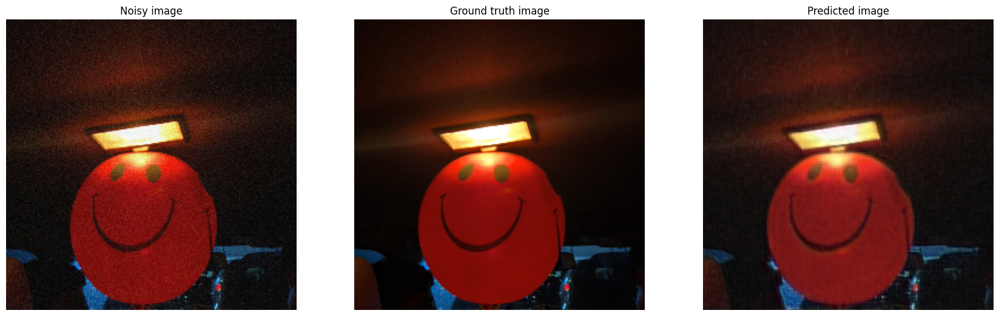

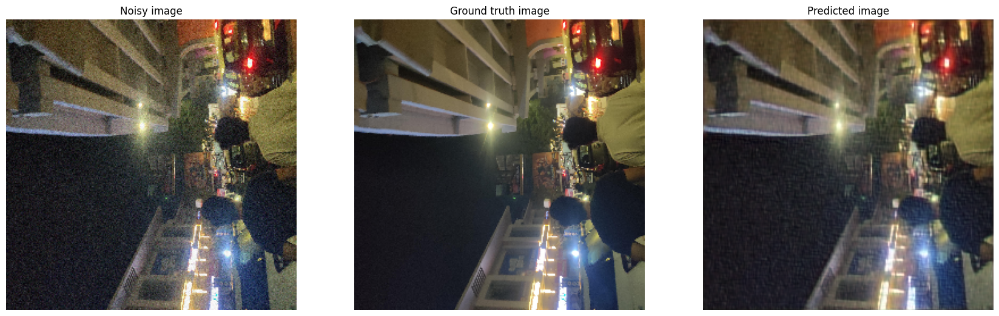

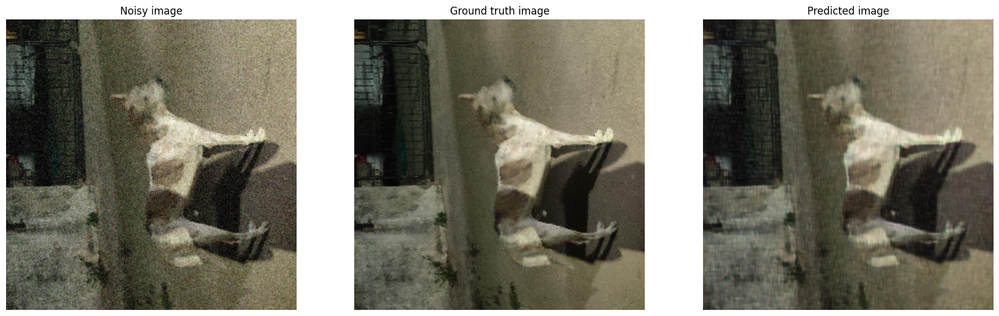

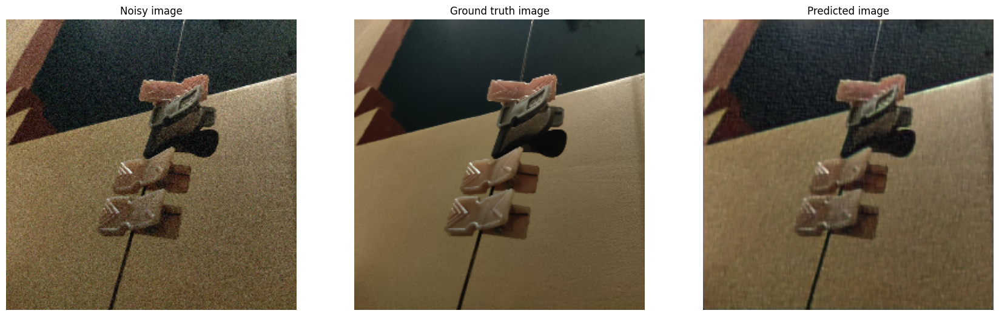

...

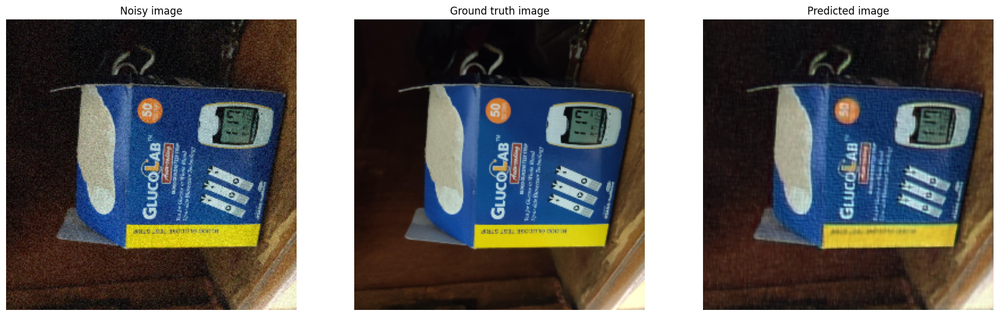

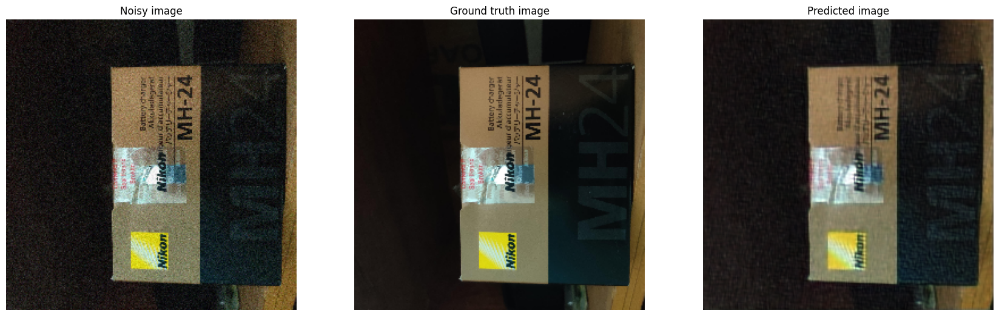

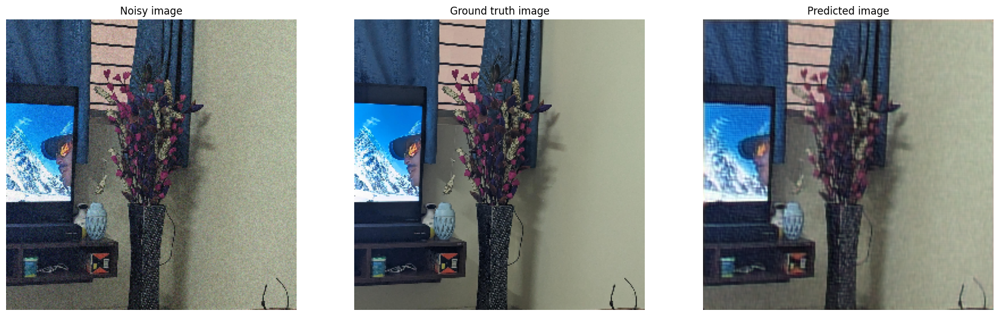

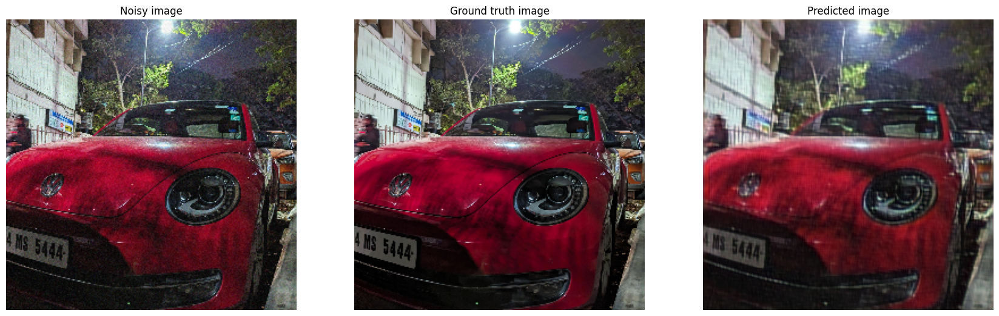

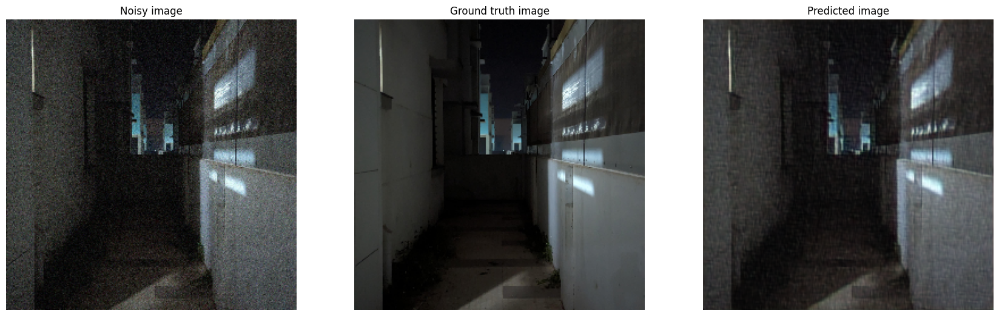

In [71]:
visualize_predictions(model, n_t_images, gt_t_images, 12)

In [ ]:
# Test image prediction
banana = "NIND_banana_ISOH3.png"
kibbles = "NIND_kibbles_ISOH3.png"
library = "NIND_BruegelLibraryS1_NZ.png"
parrots = "kodim23-noise-std51.png"
eye = "eye_closeup_smaller_DIM25_noise_stddev_51.png"

img_path = "/content/drive/MyDrive/Colab Notebooks/Applied AI Assignments/Case Study 2 Image Denoising/MWCNN/"+eye

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))

predicted_image = inference_single_image(model, img)
predicted_image/=255

f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(img)
axarr[0].title.set_text("Noisy image")
axarr[0].set_axis_off()

axarr[1].imshow(predicted_image)
axarr[1].title.set_text("Predicted image")
axarr[1].set_axis_off()

In [ ]:
from skimage.metrics import peak_signal_noise_ratio

predicted_images = inference_batch_images(model, noisy_test_images)
psnr_original_mean = 0
psnr_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images, noisy_test_images, predicted_images):
    psnr_original_mean += peak_signal_noise_ratio(gt_img, noisy_img)
    psnr_prediction_mean += peak_signal_noise_ratio(gt_img, predicted_img)

psnr_original_mean/=gt_test_images.shape[0]
psnr_prediction_mean/=gt_test_images.shape[0]
print("Original average gt-noisy PSNR ->", psnr_original_mean)
print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

In [ ]:
from skimage.metrics import structural_similarity as ssim

predicted_images = inference_batch_images(model, noisy_test_images)
ssim_original_mean = 0
ssim_prediction_mean = 0

for gt_img, noisy_img, predicted_img in zip(gt_test_images, noisy_test_images, predicted_images):
    ssim_original_mean += ssim(gt_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ssim_prediction_mean += ssim(gt_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())

ssim_original_mean/=gt_test_images.shape[0]
ssim_prediction_mean/=gt_test_images.shape[0]
print("Original average gt-noisy SSIM ->", ssim_original_mean)
print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)

In [ ]:
from prettytable import PrettyTable

pt = PrettyTable()
print("Note: Improvements shown are over original pairs")
pt.field_names = ["Model", "PSNR", "SSIM", "PSNR Improvement", "SSIM improvement"]

pt.add_row(["Original X-y pairs (No Model)","26.3779","0.6000", "-", "-"])
pt.add_row(["REDNet (Baseline)","30.5713","0.7932", "4.1934","0.1932"])
pt.add_row(["MWCNN (using Wavelets)","32.5220","0.8397","6.1441","0.2397"])
pt.add_row(["PRIDNet (using Attention)","33.3105","0.8534","6.9326","0.2534"])

print(pt)